In [1]:
!pip install -q transformers
!pip install -q sentencepiece
!pip install -q jiwer
!pip install -q datasets
!pip install -q evaluate
!pip install -q -U accelerate


!pip install -q matplotlib
!pip install -q protobuf==3.20.1
!pip install -q tensorboard

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 44.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-ai-generativelanguage 0.3.3 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 3.20.1 which

In [2]:

import os
import torch
import evaluate
import numpy as np
import pandas as pd
import glob as glob
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras

from PIL import Image
from zipfile import ZipFile
from tqdm.notebook import tqdm
from dataclasses import dataclass
from torch.utils.data import Dataset
from urllib.request import urlretrieve
from transformers import (
    VisionEncoderDecoderModel,
    TrOCRProcessor,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    default_data_collator
)

In [3]:
def download_and_unzip(url, save_path):
    print(f"Downloading and extracting assets....", end="")


    # Downloading zip file using urllib package.
    urlretrieve(url, save_path)


    try:
        # Extracting zip file using the zipfile package.
        with ZipFile(save_path) as z:
            # Extract ZIP file contents in the same directory.
            z.extractall(os.path.split(save_path)[0])


        print("Done")


    except Exception as e:
        print("\nInvalid file.", e)


URL = r"https://www.dropbox.com/scl/fi/vyvr7jbdvu8o174mbqgde/scut_data.zip?rlkey=fs8axkpxunwu6if9a2su71kxs&dl=1"
asset_zip_path = os.path.join(os.getcwd(), "scut_data.zip")

# Download if asset ZIP does not exist.
if not os.path.exists(asset_zip_path):
    download_and_unzip(URL, asset_zip_path)

# Model and Achitecture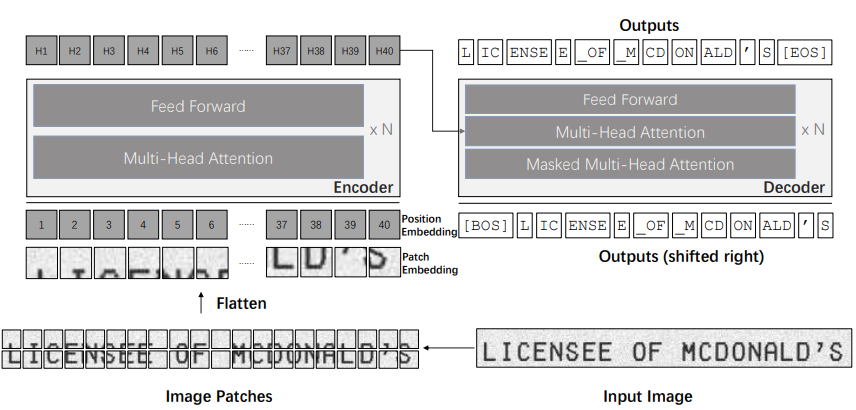


TrOCR : Transformer-based Optical Character

TrOCR is the pre-trained Transformer model that is trained with millions of images of printed text lines. This model is the generalized model. When we need to use this model in a specific task such as Handwriting recognition, we need to fine-tune this generalized model with the fine-tuned custom dataset for higher performance.

TrOCR consist of 2 stage


1.   Pretrained Vision Transformer model for encoder Images.
2.   Pretrained Language transformer model for decoder to Text.

**Input:** TrOCR received the Image that resizes from the original Image to the resolution of 384*384 pixels as an input.

**Output:** TrOCR gives the text encoded from the input image as an output.

# Used the Pre-Trained Model

## Load Image

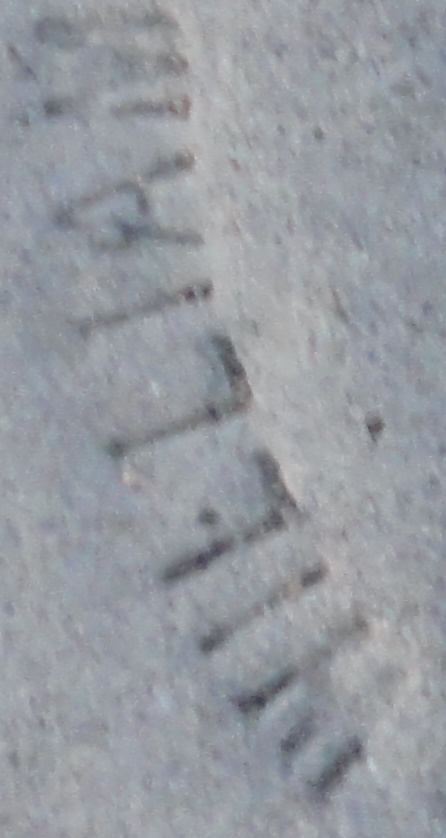

In [4]:
#Import Library ที่จำเป็น
import requests
from PIL import Image

#เลือดรูปภาพที่ต้องการนำมาทำ OCR

image = Image.open("/content/scut_data/scut_test/006090.jpg").convert("RGB")
image

## Prepare Data

In [5]:
from transformers import TrOCRProcessor

#เนื่องจาก TrOCR รับข้อมูล Input เป็นขนาดของภาพที่จำเพาะกับ Model ในที่นี้จึงใช้ TrOCRProcessor ในการประมวลผลจาก Input ต้นฉบับให้อยู่ในรูปแบบที่เหมาะสมกับ model
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-base-printed")
pixel_values = processor(image, return_tensors="pt").pixel_values
print(pixel_values.shape)

preprocessor_config.json:   0%|          | 0.00/228 [00:00<?, ?B/s]

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


tokenizer_config.json:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

torch.Size([1, 3, 384, 384])


## Load Pretrained Model
โดยปกติแล้ว TrOCR มี Pretrained model ให้เลือกใช้ทั้งหมด 3 ประเภท ได้แก้ Small, Base และ Large โดยขนาดของโมเดลจะเพิ่มขึ้น รวมถึงประสิทธิภาพของโมเดลกจะเพิ่มมากขึนด้วย อย่างไรก็ตามเมื่อขนาดของโมเดลมีขนาดใหญ่ขึ้นถึงแม้ว่าประสิทธิภาพจะเพิ่มขึ้นแต่ก็ต้องแลกมาด้วยเวลาในการเทรนและการประมวลผลที่มากขึ้นด้วยเช่นกัน จึงควรเลือกโมเดลให้เหมาะสมกับงานที่จะใช้

ในที่นี้จะเลือกใช้ Pre-Train model ชื่อ "trocr-base-printed"
ซึ่งเป็น model ที่ถูก Train ด้วยชุดข้อมูลรูปภาพตัวอักษรภาษาอังกฤษที่เป็นตัวพิมพ์

In [6]:
from transformers import VisionEncoderDecoderModel
#เลือก Pre-trained model ที่ต้องการใช้ในที่นี้จะเลือก เพื่อใช้เปรียบเทียบประสิทธิภาพก่อนและหลังการทำ Fine-Tuning
model_ori = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-base-printed")

config.json:   0%|          | 0.00/4.13k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-base-printed and are newly initialized: ['encoder.pooler.dense.weight', 'encoder.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


generation_config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

## Generate Text

In [7]:
generated_ids = model_ori.generate(pixel_values)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
print(generated_text)

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


MELIAN


# Fine-Tuning Model
เนื่องจาก TrOCR เป็นโมเดลที่ถูกเทรนมากับข้อมูลบที่เป็นตัวพิมพ์ภาษาอังกฤษแต่มักจะเป็นตัวพิมพ์ที่เป็นแนวนอนตามบรรทัด ทำให้เมื่อนำมาใช้กับรูปภาพที่ตัวอักษรมีความโค้งหรือเป็นรูปคลื่นโมเดลจะทำได้ไม่ดี การทำ Fine-Tune ในครั้งนี้จะใช้ชุดข้อมูลที่เป็นรูปภาพตัวอังษรภาษาอังกฤษที่เป็นตัวพิมพ์ แต่จะมีความโค้งงอ หรือดัดเป็นรูปแบบต่างๆ โดยชุดข้อมูลจะถูกแบ่งออกเป็น



*   Trainning Folder จำนวน 6,052 ภาพ โดยในจำนวนนี้จะถูกแบ่งเป็น Validation set 10% ทำให้มีข้อมูลดังนี้

  *   Train Set จำนวน 5,447 ภาพ
  *   Validate Set จำนวน 605 ภาพ




*   Test Folder จำนวน 1,651 ภาพ

ซึ่งรูปภาพที่ใช้ในครั้งนี้จะมีขนาดไม่เท่ากัน เนื่องจากข้อมูลถูกเก็บรวบรวมมาจากหลากหลายแหล่ง อย่างไรก็ตามจะมีกระบวนการ Pre-Processing เพื่อทำให้รูปภาพมีขนาด 384*384 pixel ก่อนส่งเข้าไปเทรนในโมเดล



## Prepare Dataset
ข้อมูลที่ดาวน์โหลดมาจะอยู่ในรูป
Train Folder
Test Folder
และมี label อยู่ใน file txt

ขั้นตอนการจัดการคิดการสร้าง DataFrame เพื่อนำไปใช้สร้าง Data Set สำหรับการทำ File Tuning ต่อไป

In [8]:
device = torch.device('cuda:0' if torch.cuda.is_available else 'cpu')

In [9]:
df = pd.read_fwf("/content/scut_data/scut_train.txt", header=None)

In [10]:
df.head()

,0,1
0,000000.jpg,BARNSTABLE
1,000001.jpg,SHERIFF'S OFFICE
2,000002.jpg,COUNTY
3,000003.jpg,Levelezo-Lap.
4,000004.jpg,Brefkort


In [11]:
#เปลี่ยนชื่อ Columns ให้สื่อความหมาย และเช็คนามสกุลของไฟล์ว่าครบถ้วนหรือไม่
df.rename(columns={0:"file_name", 1:"text"}, inplace=True)
for name in df['file_name']:
  if ".jpg" in name:
    continue
  else:
    print(name)
df.head()

,file_name,text
0,000000.jpg,BARNSTABLE
1,000001.jpg,SHERIFF'S OFFICE
2,000002.jpg,COUNTY
3,000003.jpg,Levelezo-Lap.
4,000004.jpg,Brefkort


In [12]:
#สร้าง DataFrame และเปลี่ยนชื่อเหมือนกับที่ทำใน Train
test_df = pd.read_fwf("/content/scut_data/scut_test.txt", header=None)
test_df.rename(columns={0:"file_name", 1:"text"}, inplace=True)
for name in test_df['file_name']:
  if ".jpg" in name:
    continue
  else:
    print(name)
test_df.head()

,file_name,text
0,006052.jpg,ty Starts with Education
1,006053.jpg,Cardi's
2,006054.jpg,YOU THE BUSINESS SIDE OF GREEN
3,006055.jpg,hat is
4,006056.jpg,all of us


In [13]:
print("Total data for train and validation set:", len(df['file_name']))
print("Total data for test set:", len(test_df['file_name']))

Total data for train and validation set: 6052
Total data for test set: 1651


In [14]:
# แบ่ง Train datadet ออกเป็น Training set และ validation Set ในอัตราส่วน 90:10
train_df, valid_df = train_test_split(df, test_size=0.1)

# Reset Index
train_df.reset_index(drop=True, inplace=True)
valid_df.reset_index(drop=True, inplace=True)

# ณ ตอนนี้จะได้ Dataframe ออกมา 3 ชุดได้แก่ Train, Validation และ Test

In [15]:
import torch
from torch.utils.data import Dataset
from PIL import Image

# ขั้นตอนนี้เป็ฯการเขียน Function เพื่อเปลี่ยนข้อมูลที่เป็นรูปภาพและ label ที่อยู่แยกจากกันให้อยู่ในรูปที่สามารถ Feed เข้าไปเทรนโมเดลได้โดย output ที่ออกมาจะอยู่ในรูป Dictionary ของข้อมูลรูปภาพ และ label ที่ถูกเปลี่ยนเป็น tensor แล้ว
class IAMDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=300):
        self.root_dir = root_dir
        self.df = df
        self.processor = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # get file name + text
        file_name = self.df['file_name'][idx]
        text = self.df['text'][idx]
        # prepare image (i.e. resize + normalize)
        image = Image.open(self.root_dir + file_name).convert("RGB")
        pixel_values = self.processor(image, return_tensors="pt").pixel_values
        # add labels (input_ids) by encoding the text
        labels = self.processor.tokenizer(text,
                                          padding="max_length",
                                          max_length=self.max_target_length).input_ids
        # important: make sure that PAD tokens are ignored by the loss function
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        return encoding



In [16]:
from transformers import TrOCRProcessor

# ใช้ TrOCR ในการทำ Image Pre-Processing เปลี่ยนรูปภาพให้เหมาะกับ model
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-base-printed")
train_dataset = IAMDataset(root_dir='/content/scut_data/scut_train/',
                           df=train_df,
                           processor=processor)
eval_dataset = IAMDataset(root_dir='/content/scut_data/scut_train/',
                           df=valid_df,
                           processor=processor)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


In [17]:
# หลังจากการทำลอง Check ขนาด ที่ออกมาว่าได้ขนาดที่ต้องการเหมาะกับ model หรือไม่คือ 384*384 และขนาดของ label สูงสุดอยู่ 300 ตามที่กำหนดไว้
encoding = train_dataset[0]
for k,v in encoding.items():
  print(k, v.shape)


pixel_values torch.Size([3, 384, 384])
labels torch.Size([300])


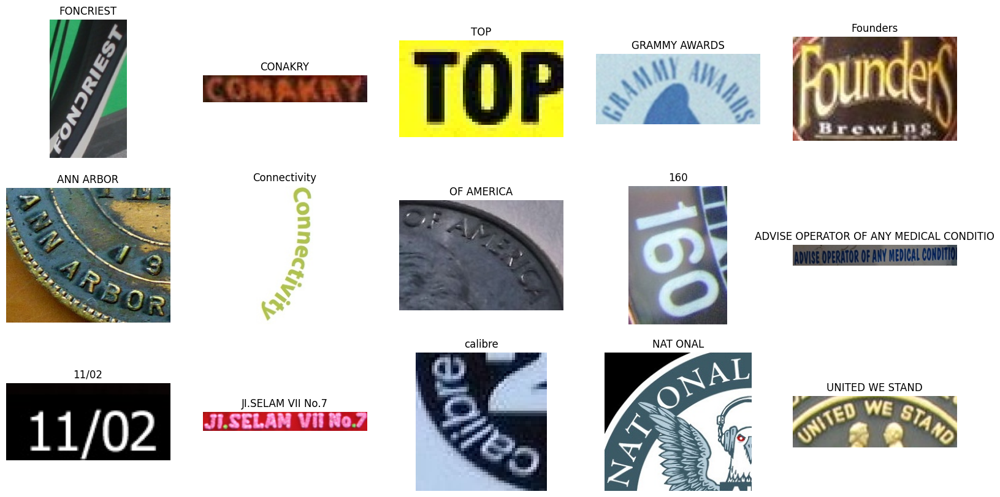

In [52]:
def visualize(dataset_path):
    plt.figure(figsize=(20, 10))
    for i in range(15):
        plt.subplot(3, 5, i+1)
        all_images = os.listdir(f"{dataset_path}/scut_train")
        image = plt.imread(f"{dataset_path}/scut_train/{all_images[i]}")
        plt.imshow(image)
        plt.axis('off')
        name = list(df['file_name'])
        plt.title(df['text'][name.index(all_images[i])])
    plt.show()


visualize('/content/scut_data')

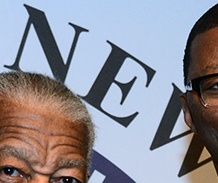

In [18]:
# test แสดงรูปภาพออกมาจาก train set
image = Image.open(train_dataset.root_dir + train_df['file_name'][0]).convert("RGB")
image

In [19]:
# test decode label จาก tensor ออกมาเป็นข้อความ
labels = encoding['labels']
labels[labels == -100] = processor.tokenizer.pad_token_id
label_str = processor.decode(labels, skip_special_tokens=True)
print(label_str)

NEW


In [20]:
# เลือก model ที่จะใช้ทำ Fine-Tuning ในที่นี้เลือก Base เพื่อจะเปรี่ยบเทียบประสิทธิภาพกับ model ก่อนทำ Fine-Tuning
from transformers import VisionEncoderDecoderModel
model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-base-printed")

Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-base-printed and are newly initialized: ['encoder.pooler.dense.weight', 'encoder.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [21]:
# set special tokens used for creating the decoder_input_ids from the labels
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
# make sure vocab size is set correctly
model.config.vocab_size = model.config.decoder.vocab_size

# set beam search parameters
model.config.eos_token_id = processor.tokenizer.sep_token_id
model.config.max_length = 64
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4

In [22]:
import accelerate
import transformers

transformers.__version__, accelerate.__version__

('4.35.2', '0.25.0')

In [23]:
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments

training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy="steps",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    fp16=True,
    output_dir="./",
    logging_steps=2,
    save_steps=1000,
    eval_steps=200,
    num_train_epochs=20
)

In [24]:
from datasets import load_metric

cer_metric = load_metric("cer")

<ipython-input-24-c81d87c6f9c2>:3: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  cer_metric = load_metric("cer")


In [25]:
def compute_metrics(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)

    return {"cer": cer}

In [26]:
from transformers import default_data_collator

# instantiate trainer
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.feature_extractor,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    data_collator=default_data_collator,
)
trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/models/trocr/processing_trocr.py:135: FutureWarning: `feature_extractor` is deprecated and will be removed in v5. Use `image_processor` instead.
  warnings.warn(


Step,Training Loss,Validation Loss,Cer
200,2.458400,2.448131,0.428121
400,2.023900,2.358088,0.469727
600,2.829600,2.152351,0.433716
800,2.867400,2.093469,0.430990
1000,2.415600,2.118654,0.429986
1200,1.712000,1.971776,0.406887
1400,1.026800,2.419848,0.418221
1600,1.199000,2.022286,0.445194
1800,1.357800,2.010760,0.461263
2000,1.475900,1.953647,0.396557


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1473: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(
Removed shared tensor {'decoder.output_projection.weight'} while saving. This should be OK, but check by verifying that you don't receive any warning while reloading


TrainOutput(global_step=13620, training_loss=0.5169667417412888, metrics={'train_runtime': 6987.693, 'train_samples_per_second': 15.587, 'train_steps_per_second': 1.949, 'total_flos': 8.150322300328083e+19, 'train_loss': 0.5169667417412888, 'epoch': 20.0})

In [27]:
test_dataset = IAMDataset(root_dir='/content/scut_data/scut_test/',
                           df=test_df,
                           processor=processor)

In [28]:
def read_and_show(image_path):
    """
    :param image_path: String, path to the input image.


    Returns:
        image: PIL Image.
    """
    image = Image.open(image_path).convert('RGB')
    return image

In [29]:
def ocr(image, processor, model):
    """
    :param image: PIL Image.
    :param processor: Huggingface OCR processor.
    :param model: Huggingface OCR model.


    Returns:
        generated_text: the OCR'd text string.
    """
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

In [30]:

def eval_new_data(
    data_path=os.path.join("/content/scut_data/scut_test/", 'scut_test', '*'),
    num_samples=50
):
    image_paths = glob.glob(data_path)
    for i, image_path in tqdm(enumerate(image_paths), total=len(image_paths)):
        if i == num_samples:
            break
        image = read_and_show(image_path)
        text = ocr(image, processor, model)
        plt.figure(figsize=(7, 4))
        plt.imshow(image)
        plt.title(text)
        plt.axis('off')
        plt.show()

  0%|          | 0/1651 [00:00<?, ?it/s]

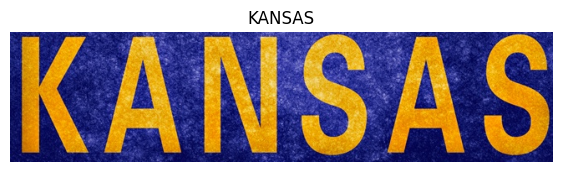

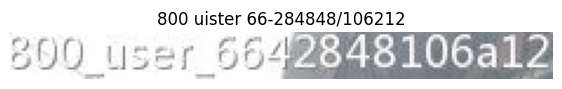

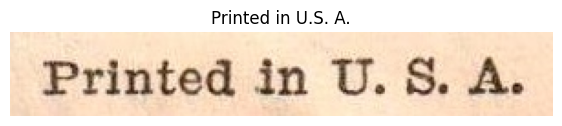

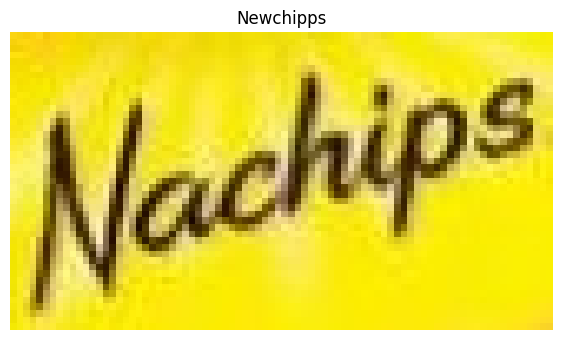

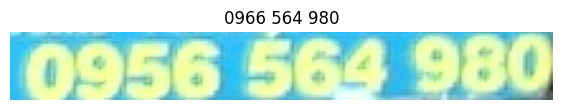

...

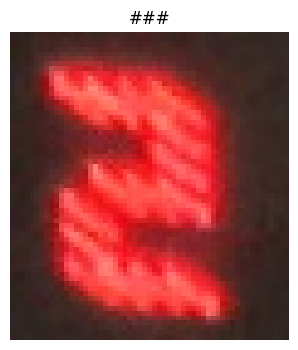

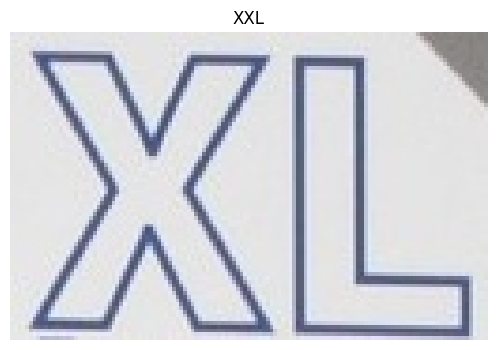

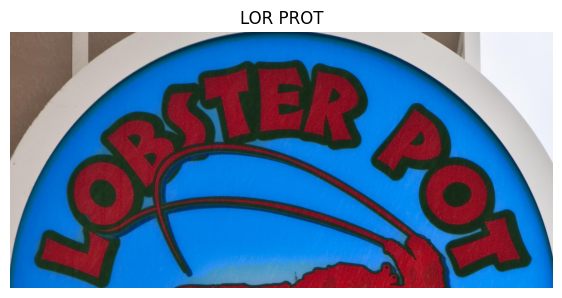

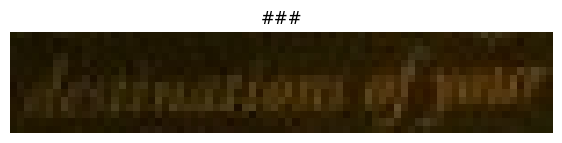

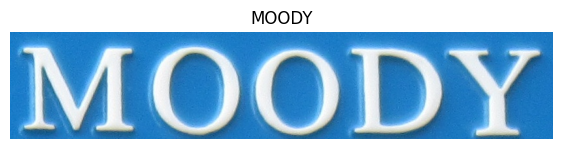

In [31]:
eval_new_data(
    data_path=os.path.join("/content/scut_data/", 'scut_test', '*'),
    num_samples=100
)

In [32]:
from torch.utils.data import DataLoader

test_dataloader = DataLoader(test_dataset, batch_size=8)

In [33]:
batch = next(iter(test_dataloader))

In [34]:
for k,v in batch.items():
  print(k, v.shape)

pixel_values torch.Size([8, 3, 384, 384])
labels torch.Size([8, 300])


In [35]:
labels = batch["labels"]
labels[labels == -100] = processor.tokenizer.pad_token_id
label_str = processor.batch_decode(labels, skip_special_tokens=True)
label_str

['ty Starts with Education',
 "Cardi's",
 'YOU THE BUSINESS SIDE OF GREEN',
 'hat is',
 'all of us',
 'WBMASON',
 'INABLECOMMUNICATIONS',
 'PROVIDING A POSITIVE CHARGE']

In [36]:
from transformers import VisionEncoderDecoderModel
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=False)
              (key): Linear(in_features=768, out_features=768, bias=False)
              (value): Linear(in_features=768, out_features=768, bias=False)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fea

In [37]:
from datasets import load_metric

cer = load_metric("cer")

In [38]:
from tqdm.notebook import tqdm

print("Running evaluation...")

for batch in tqdm(test_dataloader):
    # predict using generate
    pixel_values = batch["pixel_values"].to(device)
    outputs = model.generate(pixel_values)

    # decode
    pred_str = processor.batch_decode(outputs, skip_special_tokens=True)
    labels = batch["labels"]
    labels[labels == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels, skip_special_tokens=True)

    # add batch to metric
    cer.add_batch(predictions=pred_str, references=label_str)

final_score = cer.compute()

Running evaluation...


  0%|          | 0/207 [00:00<?, ?it/s]

In [39]:
print("Character error rate on test set:", final_score)

Character error rate on test set: 0.36323503443404553


In [40]:
cer3 = load_metric("cer")
model_ori = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-base-printed")
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-base-printed")
predics = []
labels = []
for i,name in enumerate(tqdm(test_df['file_name'])):
  image = Image.open("/content/scut_data/scut_test/"+name).convert("RGB")
  label = test_df['text'][i]
  pixel_values = processor(image, return_tensors="pt").pixel_values
  generated_ids = model_ori.generate(pixel_values)
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
  predics.append(generated_text)
  labels.append(label)

Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-base-printed and are newly initialized: ['encoder.pooler.dense.weight', 'encoder.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


  0%|          | 0/1651 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [41]:
cer_ori = load_metric("cer")
cer_ori.add_batch(predictions=predics, references=labels)
total_ori= cer_ori.compute()

In [42]:
print("Character error rate on test set for original model:", total_ori)

Character error rate on test set for original model: 0.670335491465568


# Performance Comparison

In [44]:
print("Character error rate for original model:", total_ori)
print("Character error rate after Fine-Tuning:", final_score)

Character error rate for original model: 0.670335491465568
Character error rate after Fine-Tuning: 0.36323503443404553


In [67]:
def ori_model(img_path):
  image = Image.open(img_path).convert("RGB")
  pixel_values = processor(image, return_tensors="pt").pixel_values
  generated_ids = model_ori.generate(pixel_values)
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
  return generated_text

In [68]:
def fine_model(img_path):
  img_path = img_path
  image = read_and_show(img_path)
  text = ocr(image, processor, model)
  return text

Original Model Prediction:   TY STARTS WITH EDUCATION
Fine-Tune Model Prediction:  ty Straats with Education
Label:                       ty Starts with Education


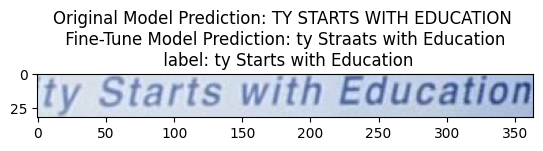

In [92]:
path = "/content/scut_data/scut_test/006052.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   LIVED HERE
Fine-Tune Model Prediction:  lived here
Label:                       lived here


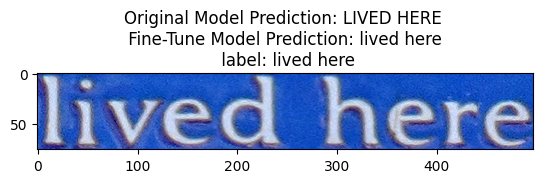

In [93]:
path = "/content/scut_data/scut_test/006151.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   1903
Fine-Tune Model Prediction:  1908
Label:                       1903


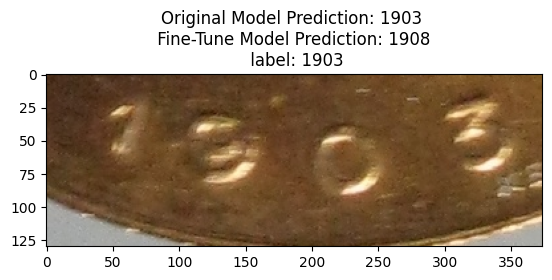

In [94]:
path = "/content/scut_data/scut_test/006217.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   90.68
Fine-Tune Model Prediction:  40.68
Label:                       ###


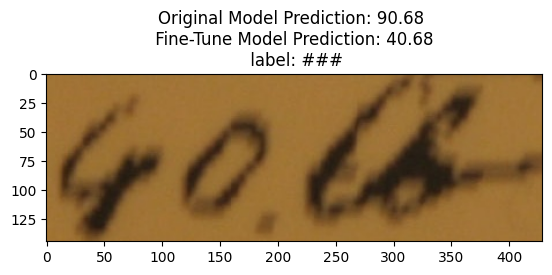

In [95]:
path = "/content/scut_data/scut_test/006331.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   POLICE
Fine-Tune Model Prediction:  POLICE
Label:                       POLICE


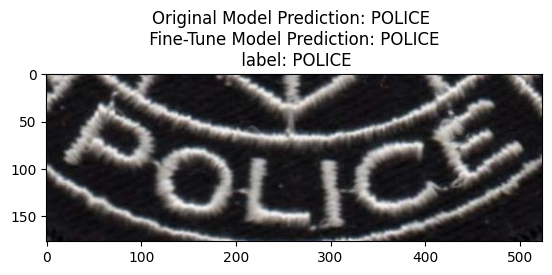

In [96]:
path = "/content/scut_data/scut_test/006360.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   TATTOO'S
Fine-Tune Model Prediction:  TATTOO'S
Label:                       TATTOO'S


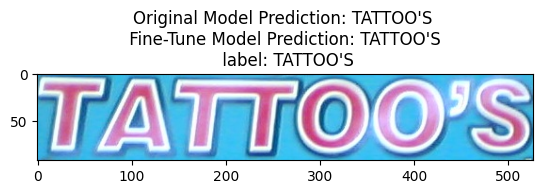

In [97]:
path = "/content/scut_data/scut_test/006401.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   ***
Fine-Tune Model Prediction:  ###
Label:                       ###


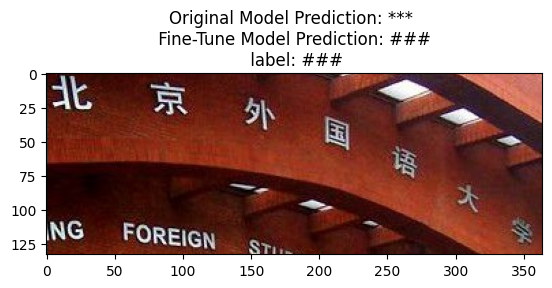

In [98]:
path = "/content/scut_data/scut_test/006555.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   HOSTLER OR FUEL KEEPER
Fine-Tune Model Prediction:  Hostler or Fuel Kepper
Label:                       Hostler or Fuel Keeper


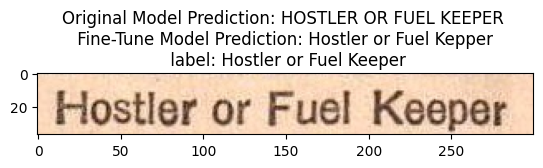

In [99]:
path = "/content/scut_data/scut_test/006599.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   SMEATAY
Fine-Tune Model Prediction:  ###
Label:                       SNEAKY


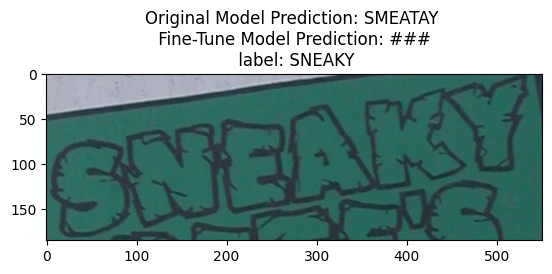

In [100]:
path = "/content/scut_data/scut_test/006687.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   GENERRY
Fine-Tune Model Prediction:  GENERAL
Label:                       GENERAL


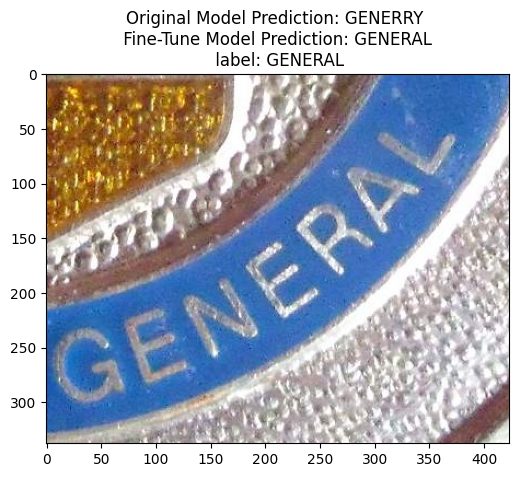

In [101]:
path = "/content/scut_data/scut_test/006700.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   ERIOR
Fine-Tune Model Prediction:  ###
Label:                       OUIJA


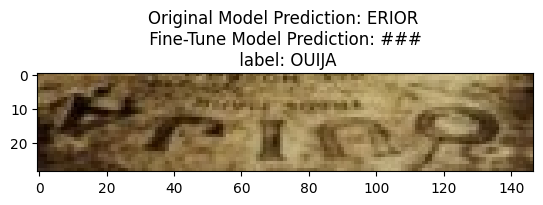

In [102]:
path = "/content/scut_data/scut_test/006721.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   CASHIER:
Fine-Tune Model Prediction:  GOUNNESS WORLD
Label:                       GUINNESS WORLD


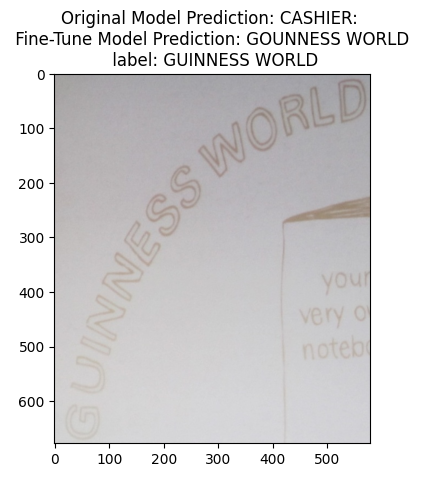

In [104]:
path = "/content/scut_data/scut_test/006847.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)

Original Model Prediction:   MOM
Fine-Tune Model Prediction:  Honz
Label:                       Mom


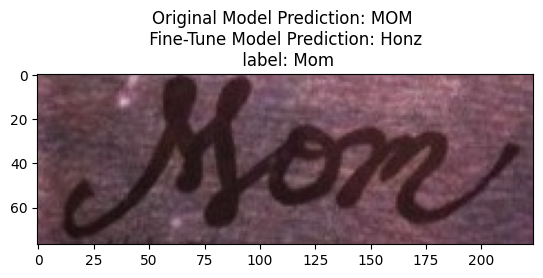

In [111]:
path = "/content/scut_data/scut_test/006979.jpg"
name = path.split("/")[-1]
name_all = list(test_df['file_name'])
label = test_df['text'][name_all.index(name)]
image = Image.open(path).convert("RGB")
plt.imshow(image)
ori = ori_model(path)
fine = fine_model(path)
plt.title(f"Original Model Prediction: {ori} \n Fine-Tune Model Prediction: {fine} \n label: {label}")
print("Original Model Prediction:  ",ori)
print("Fine-Tune Model Prediction: ",fine)
print("Label:                      ",label)